# Compare snow cover products

In [2]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
# sys.path.insert(1, '/home/mlalande/notebooks/utils') # to include my util file in previous directory
sys.path.insert(1, '/home/lalandmi/Dropbox/Thèse/notebooks/utils') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
# u.check_virtual_memory()

3.8.5 | packaged by conda-forge | (default, Jul 24 2020, 01:25:15) 
[GCC 7.5.0]


## Set variables

In [3]:
period = slice('2001','2012')
latlim, lonlim = u.get_domain_HMA()
seasons = ['Annual', 'DJFMA', 'JJAS']
root_data_path = '/home/lalandmi/Dropbox/data/' # local

# Make a extended version for regridding properly on the edges
latlim_ext, lonlim_ext = slice(latlim.start-5, latlim.stop+5), slice(lonlim.start-5, lonlim.stop+5)

# Get zone limits for annual cycle
lonlim_HK, latlim_HK, lonlim_HM, latlim_HM, lonlim_TP, latlim_TP = u.get_zones()

# HMA for full domain and the following for the above zones
zones = ['HMA', 'HK', 'HM', 'TP']
zones_df = pd.DataFrame(
    [[lonlim, latlim], [lonlim_HK, latlim_HK], [lonlim_HM, latlim_HM], [lonlim_TP, latlim_TP]], 
    columns=pd.Index(['lonlim', 'latlim'], name='Limits'),
    index=pd.Index(zones, name='Zones')
)

## Load topo

In [4]:
ds = xr.open_dataset(root_data_path+'GMTED2010/GMTED2010_15n060_0250deg.nc').drop_dims('nbounds').swap_dims(
    {'nlat': 'latitude', 'nlon': 'longitude'}).drop({'nlat', 'nlon'}).rename(
    {'latitude': 'lat', 'longitude': 'lon'}).sel(lat=latlim_ext, lon=lonlim_ext)
elevation = ds.elevation
elevation_std = ds.elevation_stddev

In [5]:
ds = xr.open_dataset(root_data_path+'GMTED2010/GMTED2010_15n015_00625deg.nc').drop_dims('nbounds').swap_dims(
    {'nlat': 'latitude', 'nlon': 'longitude'}).drop({'nlat', 'nlon'}).rename(
    {'latitude': 'lat', 'longitude': 'lon'}).sel(lat=latlim_ext, lon=lonlim_ext)
elevation_HR = ds.elevation
elevation_std_HR = ds.elevation_stddev

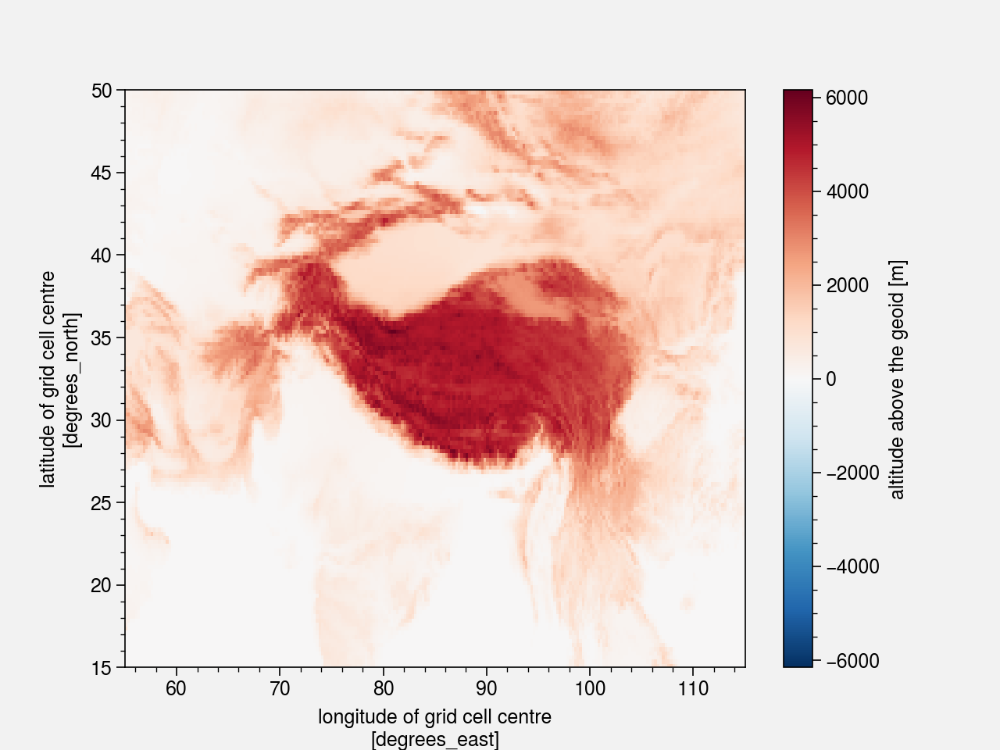

In [6]:
elevation.plot()

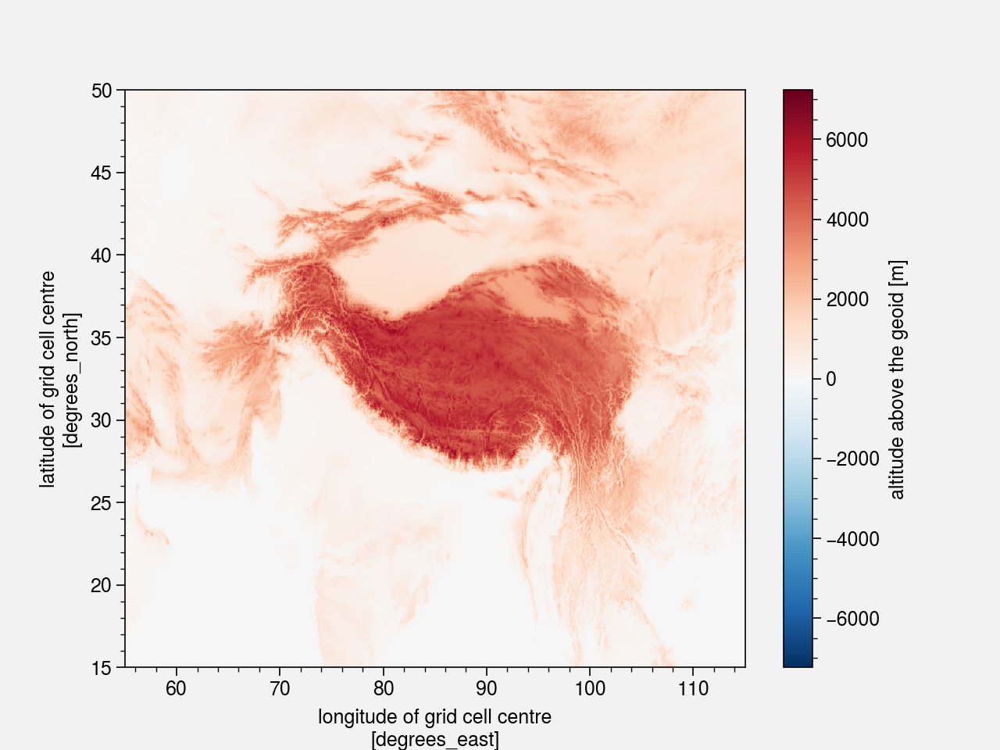

In [7]:
elevation_HR.plot()

## NOAA CDR

In [8]:
ds_rutger = xr.open_dataset(root_data_path+'NOAA_CDR_NH_SCE/nhsce_v01r01_19661004_20201005.nc').sel(time=period)
with xr.set_options(keep_attrs=True): # Get the snc variable, keep only land data and convert to %
    obs = ds_rutger.snow_cover_extent.where(ds_rutger.land == 1)*100   
obs.attrs['units'] = '%'
obs = obs.rename({'longitude': 'lon', 'latitude': 'lat'}) # Rename lon and lat for the regrid

# Resamble data per month (from per week)
obs = obs.resample(time='1MS').mean('time', skipna=False, keep_attrs=True)

# Check if the time steps are ok
np.testing.assert_equal((int(period.stop) - int(period.start) + 1)*12, obs.time.size)

# Because obs are not global (https://github.com/JiaweiZhuang/xESMF/issues/15)
import scipy
def add_matrix_NaNs(regridder):
        X = regridder.weights
        M = scipy.sparse.csr_matrix(X)
        num_nonzeros = np.diff(M.indptr)
        M[num_nonzeros == 0, 0] = np.NaN
        regridder.weights = scipy.sparse.coo_matrix(M)
        return regridder

regridder = xe.Regridder(obs, elevation, 'bilinear', periodic=False, reuse_weights=True)
regridder = add_matrix_NaNs(regridder)
noaa_cdr = regridder(obs)

Reuse existing file: bilinear_88x88_140x240.nc


/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


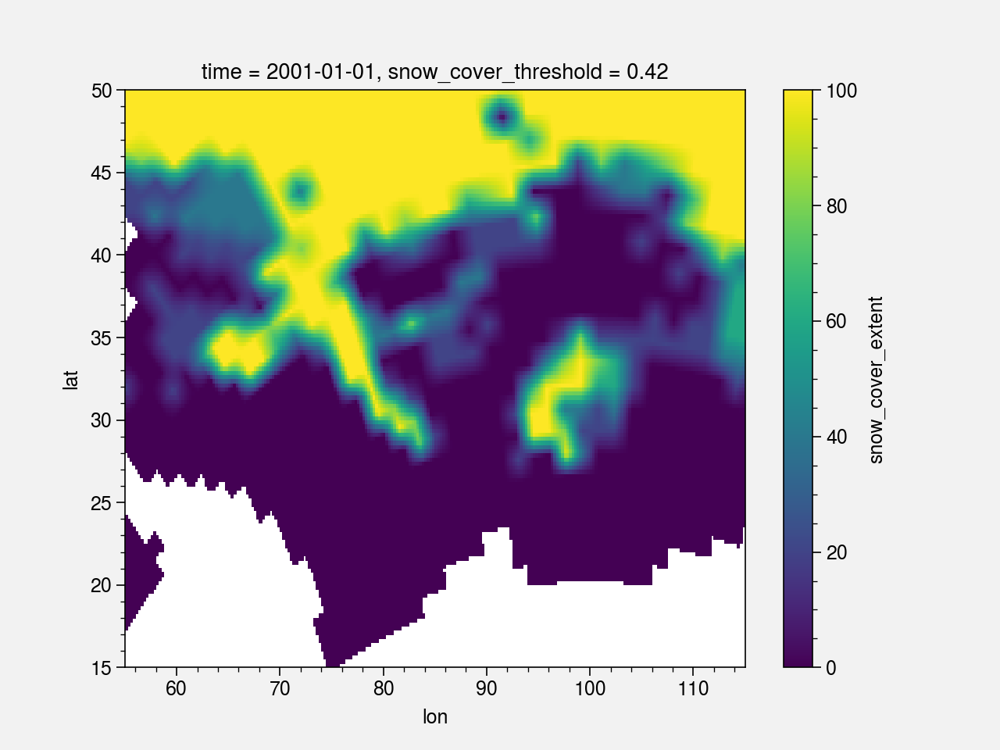

In [9]:
noaa_cdr[0].plot()

## NOAA CDR HR
I select only values with valid lat and lon for regrid: .isel(x=slice(158,867), y=slice(158,867)) (missing lat/lon values are set to ~9.9e+36)

In [10]:
ds_rutger = xr.open_dataset(root_data_path+'NOAA_CDR_NH_SCE/G10035-rutgers-nh-24km-weekly-sce-v01r00-19800826-20200831_newer_without_xy.nc').sel(time=period).isel(x=slice(158,867), y=slice(158,867))
with xr.set_options(keep_attrs=True): # Get the snc variable, keep only land data and convert to %
    obs = ds_rutger.snow_cover_extent.where(ds_rutger.land == 1)*100   
obs.attrs['units'] = '%'
obs = obs.rename({'longitude': 'lon', 'latitude': 'lat'}) # Rename lon and lat for the regrid

# Resamble data per month (from per week)
obs = obs.resample(time='1MS').mean('time', skipna=False, keep_attrs=True)

# Check if the time steps are ok
np.testing.assert_equal((int(period.stop) - int(period.start) + 1)*12, obs.time.size)

# Because obs are not global (https://github.com/JiaweiZhuang/xESMF/issues/15)
import scipy
def add_matrix_NaNs(regridder):
        X = regridder.weights
        M = scipy.sparse.csr_matrix(X)
        num_nonzeros = np.diff(M.indptr)
        M[num_nonzeros == 0, 0] = np.NaN
        regridder.weights = scipy.sparse.coo_matrix(M)
        return regridder

regridder = xe.Regridder(obs, elevation, 'bilinear', periodic=False, reuse_weights=True)
regridder = add_matrix_NaNs(regridder)
noaa_cdr_hr = regridder(obs)

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(


Reuse existing file: bilinear_709x709_140x240.nc


/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


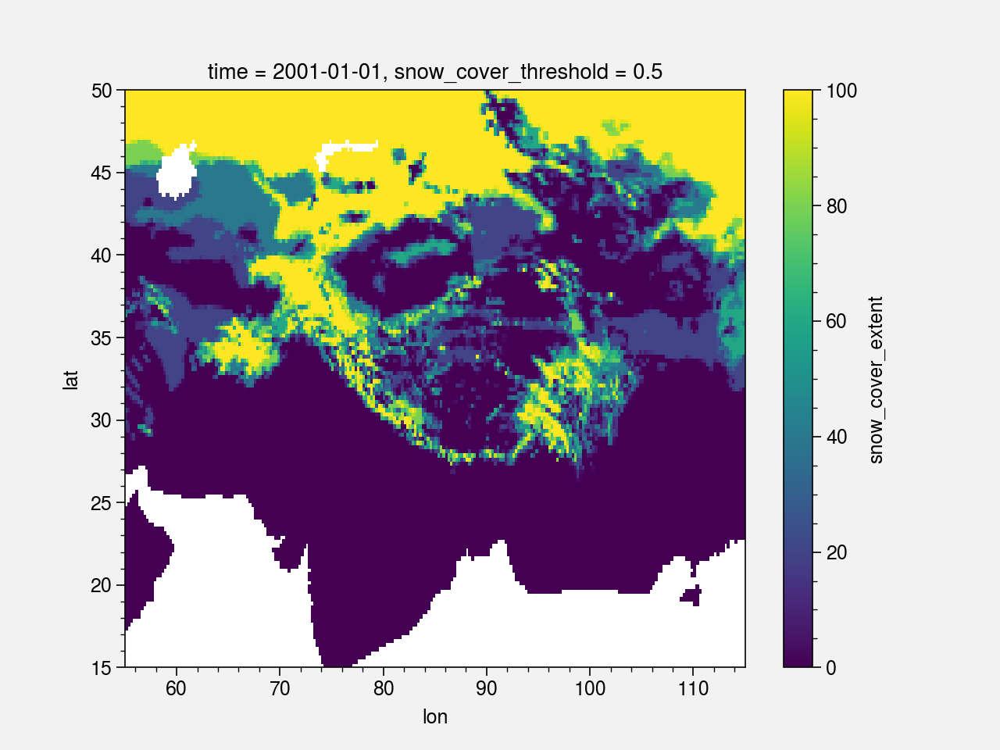

In [11]:
noaa_cdr_hr[0].plot()

## MEaSUREs
https://nsidc.org/data/nsidc-0530

In [12]:
obs = xr.open_mfdataset(
    root_data_path+'MEaSUREs/monthly/nhtsd25e2_*_v01r01.nc', combine='by_coords'
).merged_snow_cover_extent.sel(time=period).load() * 100
obs = obs.rename({'longitude': 'lon', 'latitude': 'lat'})

In [13]:
# Check if the time steps are ok
np.testing.assert_equal((int(period.stop) - int(period.start) + 1)*12, obs.time.size)

# Because obs are not global (https://github.com/JiaweiZhuang/xESMF/issues/15)
import scipy
def add_matrix_NaNs(regridder):
        X = regridder.weights
        M = scipy.sparse.csr_matrix(X)
        num_nonzeros = np.diff(M.indptr)
        M[num_nonzeros == 0, 0] = np.NaN
        regridder.weights = scipy.sparse.coo_matrix(M)
        return regridder

regridder = xe.Regridder(obs, elevation, 'bilinear', periodic=False, reuse_weights=True)
regridder = add_matrix_NaNs(regridder)
measures = regridder(obs)

Reuse existing file: bilinear_720x720_140x240.nc


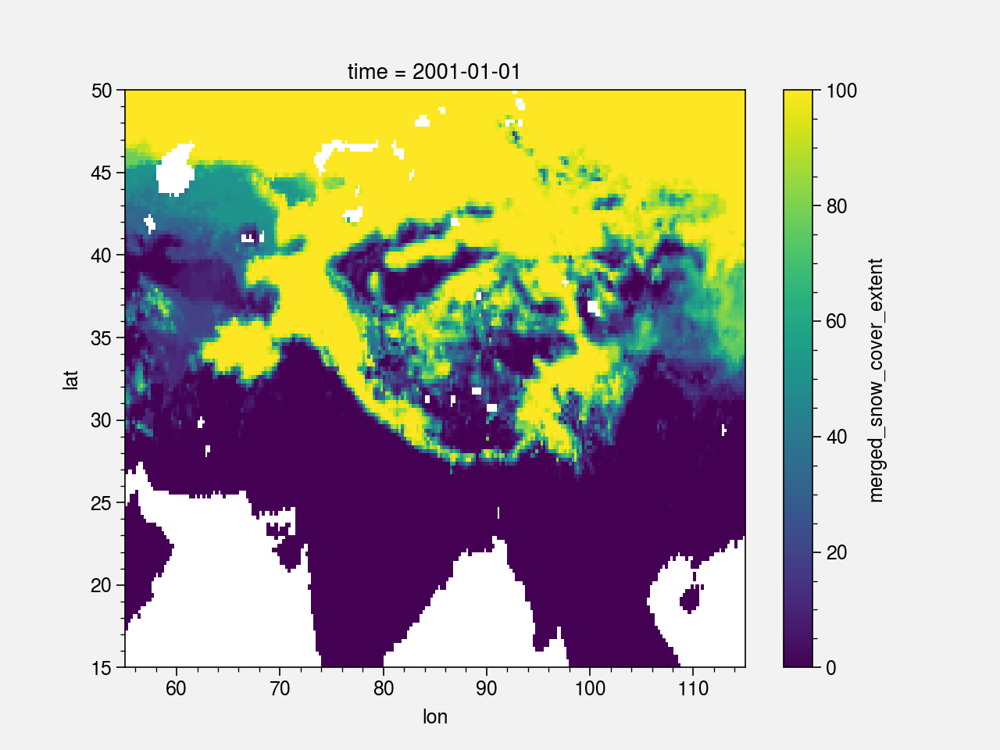

In [14]:
measures[0].plot()

## ESA snow CCI

In [15]:
obs = xr.open_dataarray(
    root_data_path+'esacci/ESA_CCI_snow_SCFG_v1.0_HKH_gapfilled_monthly/ESACCI-L3C_SNOW-SCFG-AVHRR_MERGED-fv1.0_HKH_gapfilled_montlhy_1982-2014.nc'
).sel(time=period)

# Check if the time steps are ok
np.testing.assert_equal((int(period.stop) - int(period.start) + 1)*12, obs.time.size)

# # Because obs are not global (https://github.com/JiaweiZhuang/xESMF/issues/15)
# import scipy
# def add_matrix_NaNs(regridder):
#         X = regridder.weights
#         M = scipy.sparse.csr_matrix(X)
#         num_nonzeros = np.diff(M.indptr)
#         M[num_nonzeros == 0, 0] = np.NaN
#         regridder.weights = scipy.sparse.coo_matrix(M)
#         return regridder

# regridder = xe.Regridder(obs, elevation, 'bilinear', periodic=False, reuse_weights=True)
# regridder = add_matrix_NaNs(regridder)
# snow_cci = regridder(obs)

snow_cci = obs

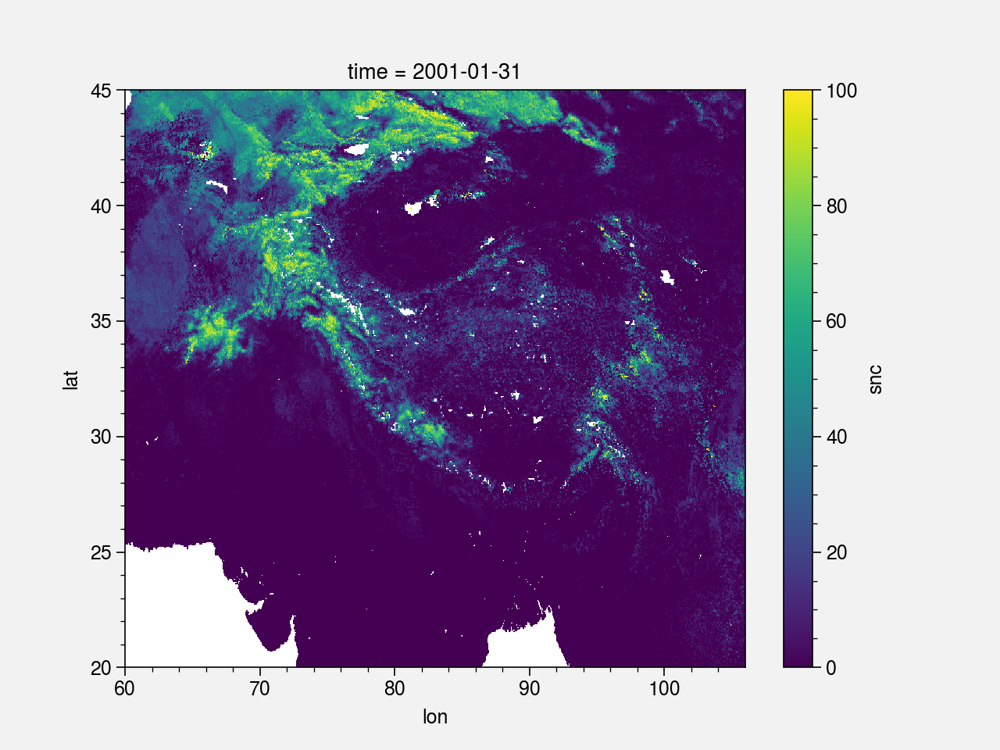

In [16]:
snow_cci[0].plot()

## MODIS/Terra Snow Cover Monthly L3 Global 0.05Deg CMG, Version 6

Check http://localhost:7227/tree/notebooks/Observations/MODIS/MOD10CM for pretreatment (hdf -> netcdf)

https://nsidc.org/data/MOD10CM

Grid The MODIS CMG consists of 7200 columns by 3600 rows. Each cell has a resolution of 0.05 degrees (approximately 5 km). The upper-left corner of the upper-left cell is -180.00 degrees longitude, 90.00 degrees latitude. The lower-right corner of the lower right cell is -180.00 degrees longitude, -90.00 degrees latitude. For additional details about the MODIS Climate Modeling Grid, see the NASA MODIS Lands | MODIS Grids Web page.

The following resources can help you select and work with gridded MODIS data:

HDF-EOS to GeoTIFF Conversion Tool (HEG)

Other products: https://modis.gsfc.nasa.gov/data/dataprod/mod10.php  
More info on grids: https://modis-land.gsfc.nasa.gov/MODLAND_grid.html

In [17]:
# Attention manque certains mois...

obs = xr.open_mfdataset(root_data_path+'MODIS/MOD10CM/netcdf/*.nc', combine='by_coords').sel(
    lat=slice(latlim_ext.stop, latlim_ext.start), 
    lon=lonlim_ext, time=period).Snow_Cover_Monthly_CMG
modis = obs.where(obs <= 100)

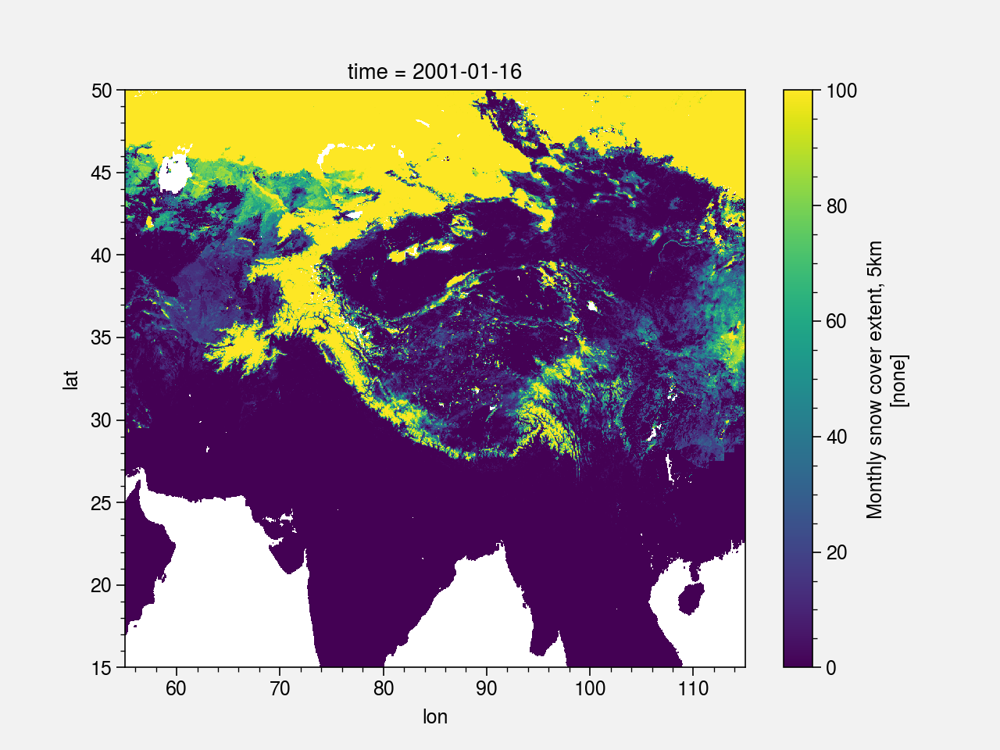

In [18]:
modis[0].plot()

# Plot

In [19]:
obs_list = [noaa_cdr, noaa_cdr_hr, measures, snow_cci, modis]
obs_list_names = ['NOAA CDR (~200km -> 0.25°)', 'NOAA CDR HR (~25km -> 0.25°)', 'MEaSUREs (~25km -> 0.25°)', 'Snow CCI (0.05°)', 'MODIS (0.05°)']

obs_list_seas = []

for obs in obs_list:
    obs_list_seas.append(obs.groupby('time.season').mean('time').load())

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


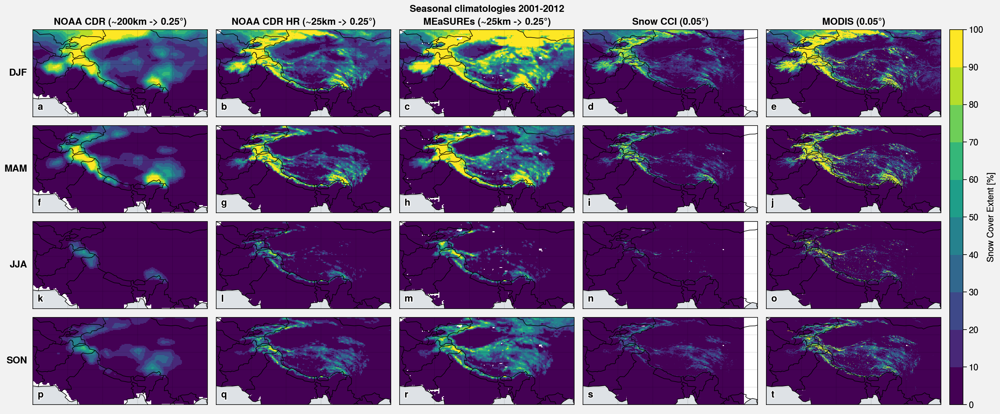

In [20]:
seasons = ['DJF', 'MAM', 'JJA', 'SON']
# seasons = ['DJF']

fig, axs = plot.subplots(ncols=len(obs_list), nrows=len(seasons), proj='cyl')

k = 0
for i_season, season in enumerate(seasons):
    for obs in obs_list_seas:
        m = axs[k].pcolormesh(obs.sel(season=season), cmap='viridis', levels=plot.arange(0,100,10))
        k += 1

fig.colorbar(m, label='Snow Cover Extent [%]')        

axs.format(
    # Grids, labels and limits
    labels=False, lonlines=10, latlines=5, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    abc=True, abcloc='ll',
    collabels=obs_list_names, rowlabels=seasons,
    suptitle='Seasonal climatologies '+period.start+'-'+period.stop
)

# fig.save('img/snc_compare_products_seas.jpg')

In [37]:
noaa_cdr_hr

<xarray.DataArray 'snow_cover_extent' (time: 144, lat: 140, lon: 240)>
array([[[         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        ...,
        [100.        , 100.        , 100.        , ..., 100.        ,
         100.        , 100.        ],
        [100.        , 100.        , 100.        , ..., 100.        ,
         100.        , 100.        ],
        [100.        , 100.        , 100.        , ..., 100.        ,
         100.        , 100.        ]],

       [[         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
...
        [  0.        ,   0.        ,  14.07842076, ...,  65.85297   ,
          75.        ,  75.        ],
        [  7.16870331,  21.46827361,  35.82922785, ...,  58.13258025,
          75.        ,  75.        ],
        [ 29.083028  ,  43.28298128,  50.        , ...,  73.21383644,
          75.6662399 ,  75.        ]],

       [[         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        ...,
        [ 80.        ,  80.        ,  80.        , ..., 100.        ,
         100.        , 100.        ],
        [ 80.        ,  80.        ,  80.        , ..., 100.        ,
         100.        , 100.        ],
        [ 80.        ,  80.        ,  80.        , ..., 100.        ,
         100.        , 100.        ]]])
Coordinates:
  * time                  (time) datetime64[ns] 2001-01-01 ... 2012-12-01
    snow_cover_threshold  float32 0.5
  * lon                   (lon) float32 55.125 55.375 55.625 ... 114.625 114.875
  * lat                   (lat) float32 15.125 15.375 15.625 ... 49.625 49.875
Attributes:
    regrid_method:  bilinear

In [38]:
regridder = xe.Regridder(modis, noaa_cdr_hr, 'bilinear', periodic=False, reuse_weights=True)
modis_regrid = regridder(modis)

Create weight file: bilinear_700x1200_140x240.nc


/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


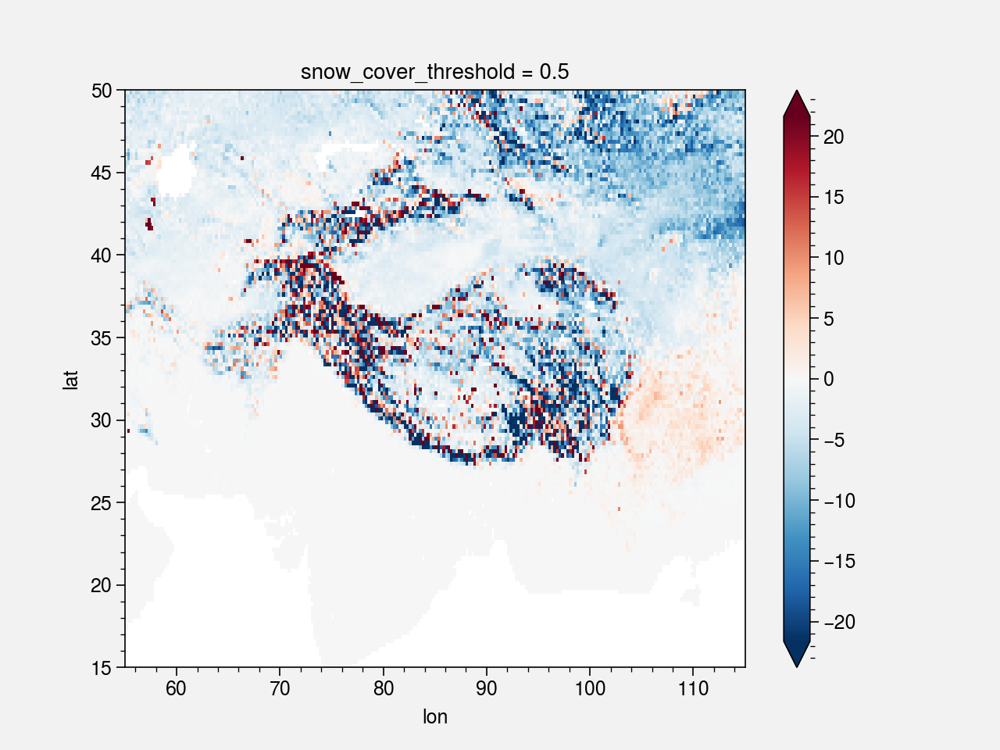

In [42]:
(modis_regrid.mean('time') - noaa_cdr_hr.mean('time')).plot(robust=True)

In [36]:
modis

,Array,Chunk
Bytes,473.76 MB,3.36 MB
Shape,"(141, 700, 1200)","(1, 700, 1200)"
Count,1008 Tasks,141 Chunks
Type,float32,numpy.ndarray


In [32]:
ds = xr.open_mfdataset(root_data_path+'esacci/ESA_CCI_snow_SCFG_v1.0/AVHRR_MERGED/v1.0/2003/*/*.nc', combine='by_coords').sel(
    lat=latlim_ext, lon=lonlim_ext
)

In [24]:
ds

,Array,Chunk
Bytes,4.04 MB,11.20 kB
Shape,"(361, 700, 2)","(1, 700, 2)"
Count,1805 Tasks,361 Chunks
Type,float64,numpy.ndarray
,Array,Chunk
Bytes,6.93 MB,19.20 kB
Shape,"(361, 1200, 2)","(1, 1200, 2)"
Count,1805 Tasks,361 Chunks
Type,float64,numpy.ndarray
,Array,Chunk


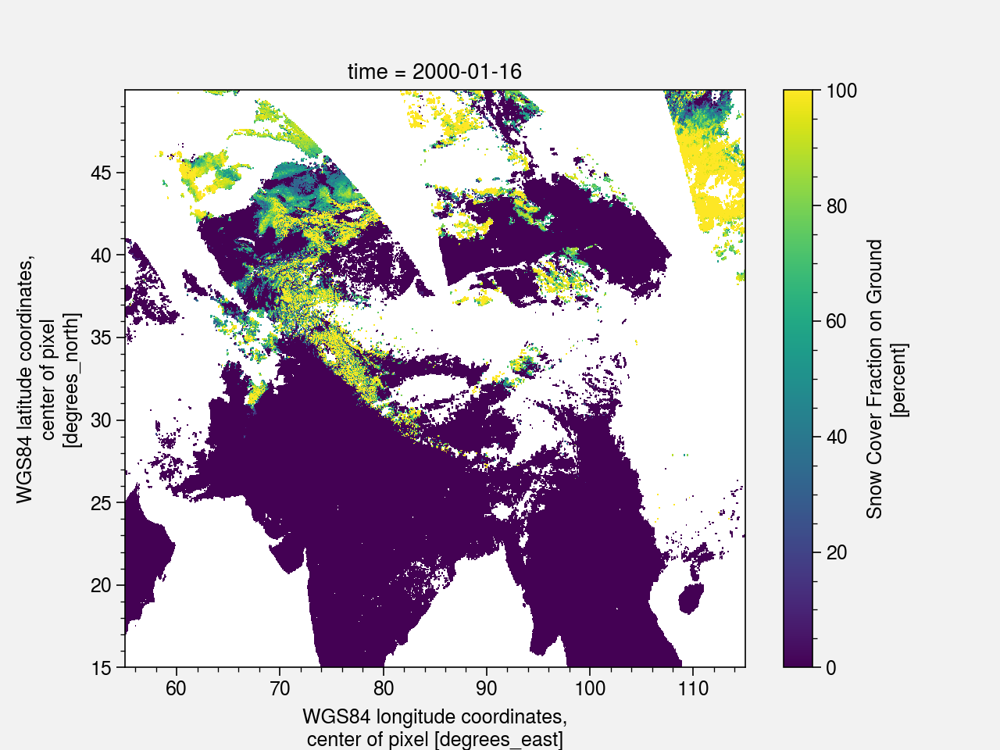

In [58]:
ds.scfg[14].where(ds.scfg[14] <= 100).plot()

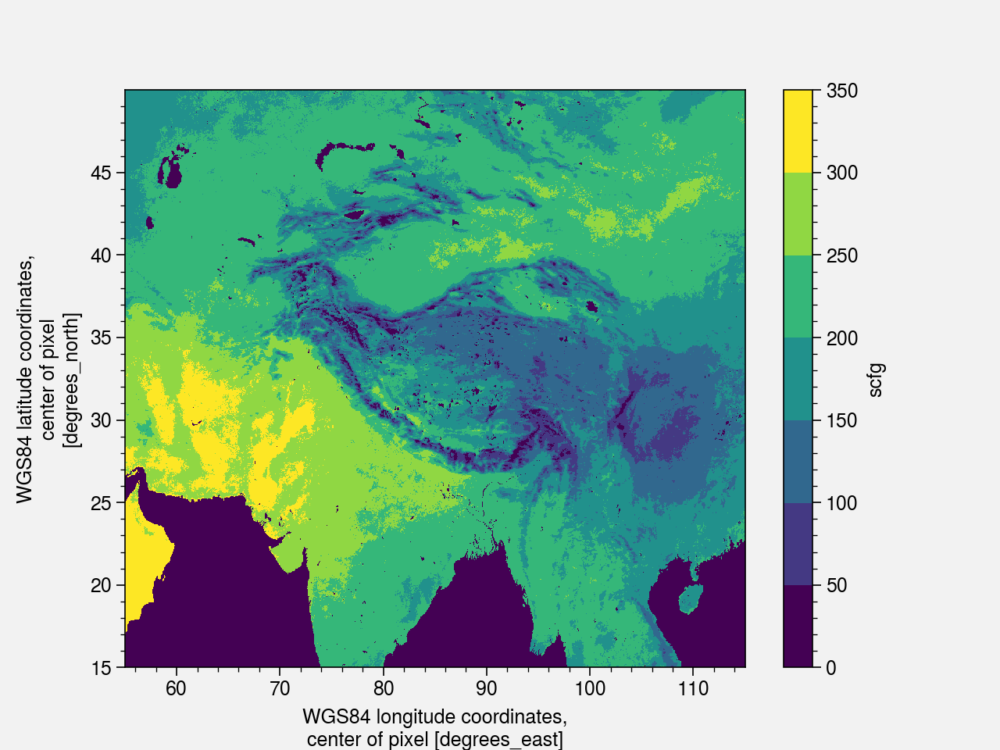

In [35]:
ds.scfg.where(ds.scfg <= 100).count('time').plot(levels=plot.arange(0,350,50))

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


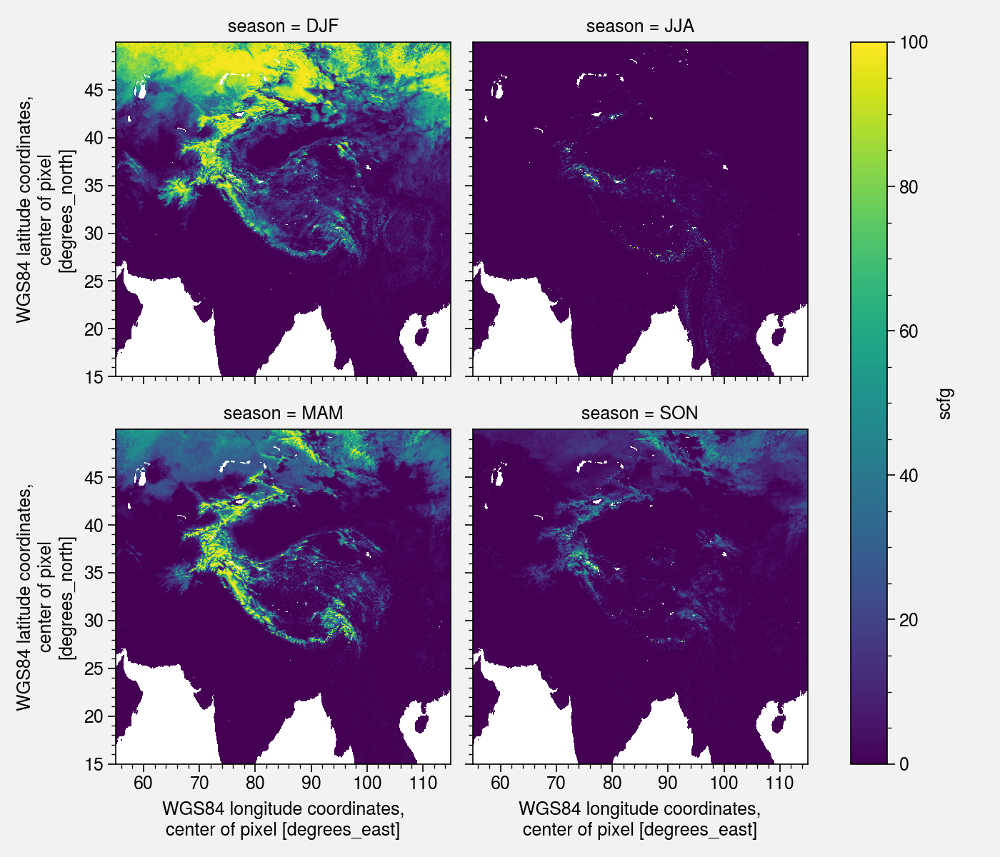

In [34]:
ds.scfg.where(ds.scfg <= 100).groupby('time.season').mean('time').plot(col='season', col_wrap=2)

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


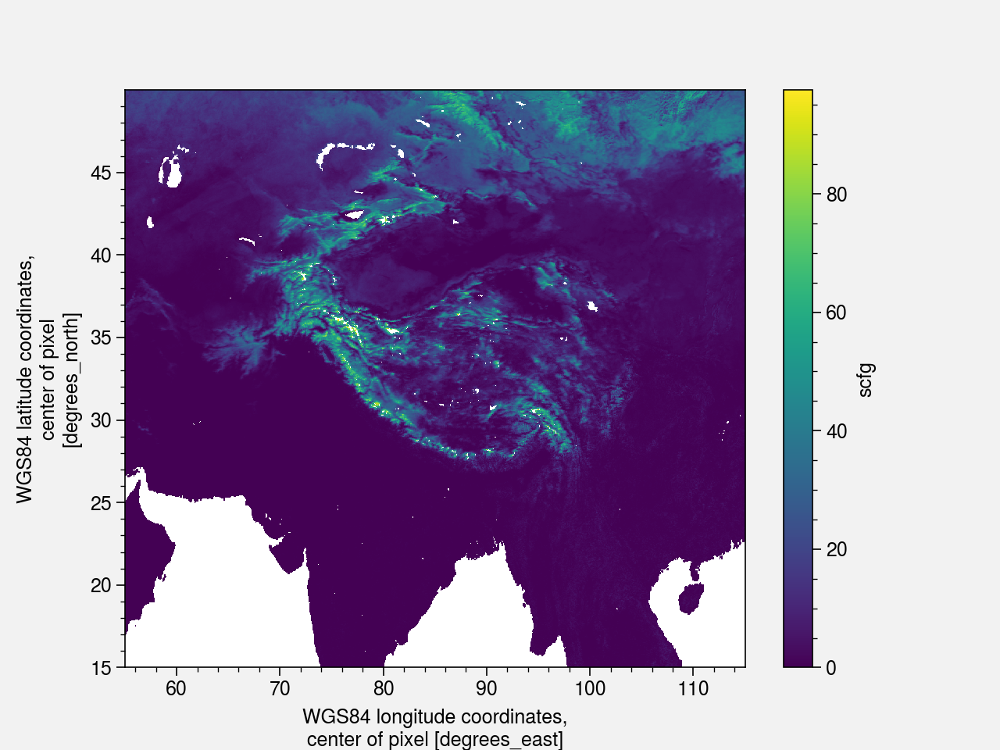

In [30]:
ds.scfg.where(ds.scfg <= 100).mean('time').plot()

In [93]:
da = obs_list[3].groupby('time.month').mean('time')

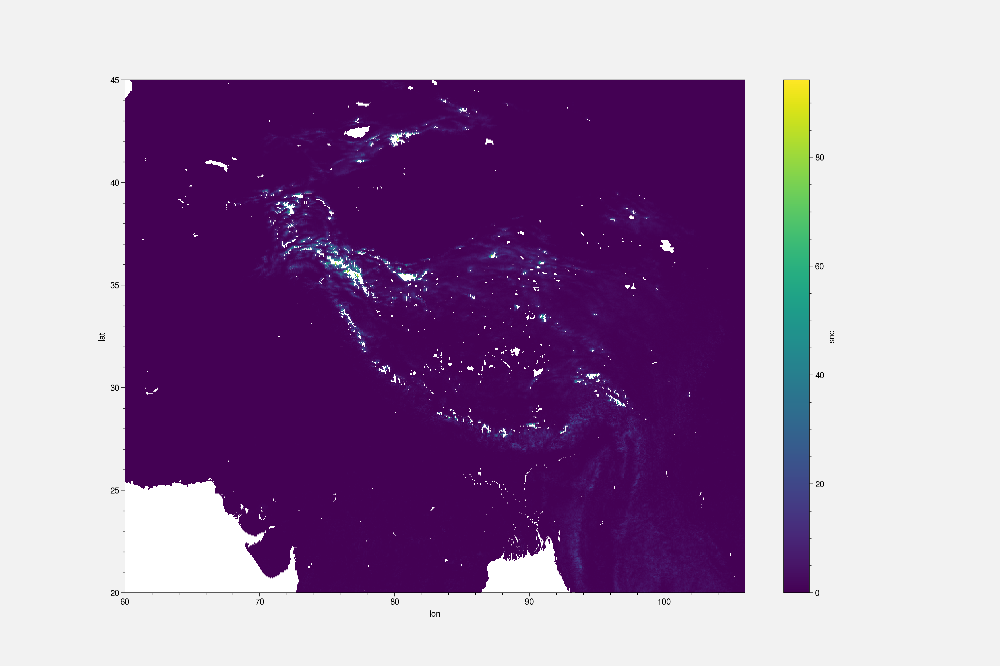

In [92]:
da.where((da.month > 5) & (da.month <10)).mean('month').plot(figsize=(15,10))

### Trends

In [67]:
def corr(x, y, dim):
    return xr.apply_ufunc(
        stats.linregress, x, y,
        input_core_dims=[[dim], [dim]],
        output_core_dims=[[], [], [], [], []],
        vectorize=True
    )

def theilslopes(y, x, dim):
    return xr.apply_ufunc(
        stats.theilslopes, y, x,
        input_core_dims=[[dim], [dim]],
        output_core_dims=[[], [], [], []],
        vectorize=True
    )

In [70]:
obs_list = [noaa_cdr, noaa_cdr_hr, measures, snow_cci]
obs_list_names = ['NOAA CDR', 'NOAA CDR HR', 'MEaSUREs', 'Snow CCI']

ym_obs = []
for obs in obs_list:
    ym_temp = []
    for season in seasons:
        # Make annual mean
        ym = u.year_mean(obs.load(), calendar='standard', season=season)

        # Compute trends
        for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym.year, ym, 'year')):
            ym[arr_name] = arr
            
        # Compute theilslopes (https://docs.scipy.org/doc/scipy-0.15.1/reference/generated/scipy.stats.mstats.theilslopes.html)
        for arr_name, arr in zip(['medslope', 'medintercept', 'lo_slope', 'up_slope'], theilslopes(ym, ym.year, 'year')):
            ym[arr_name] = arr

        ym_temp.append(ym)

    ym_obs.append(xr.concat(ym_temp, pd.Index(seasons, name='season')))

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(
/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  group

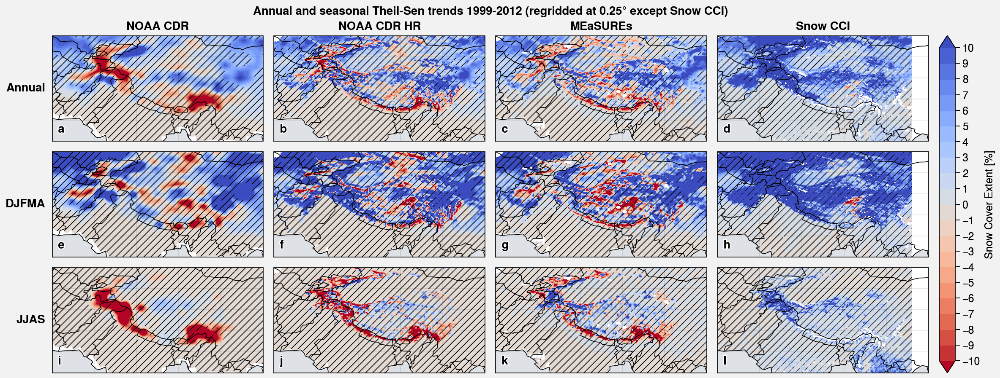

In [71]:
obs_list = [noaa_cdr, noaa_cdr_hr, measures, snow_cci]
obs_list_names = ['NOAA CDR', 'NOAA CDR HR', 'MEaSUREs', 'Snow CCI']

fig, axs = plot.subplots(ncols=len(obs_list), nrows=len(seasons), proj='cyl')

k = 0
for i_season, season in enumerate(seasons):
    for obs in ym_obs:
        m = axs[k].contourf(obs.sel(season=season).slope*10, cmap='CoolWarm_r', levels=plot.arange(-10,10,1), extend='both')
        pvalue = obs.sel(season=season).pvalue
        axs[k].contourf(pvalue.where(pvalue>0.05), hatches=['////'], alpha=0)
        k += 1

fig.colorbar(m, label='Snow Cover Extent [%]')        

axs.format(
    # Grids, labels and limits
    labels=False, lonlines=10, latlines=5, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    abc=True, abcloc='ll',
    collabels=obs_list_names, rowlabels=seasons,
    suptitle='Annual and seasonal Theil-Sen trends '+period.start+'-'+period.stop+' (regridded at 0.25° except Snow CCI)'
)

# fig.save('img/snc_product_trends_without_regrid.jpg')

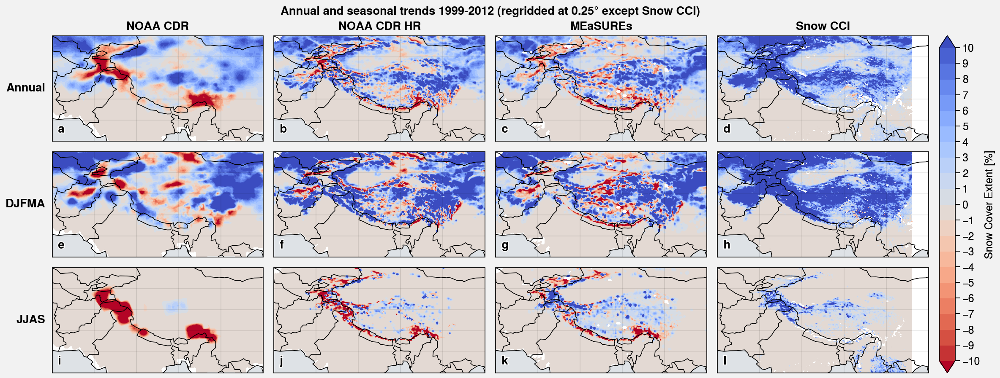

In [72]:
obs_list = [noaa_cdr, noaa_cdr_hr, measures, snow_cci]
obs_list_names = ['NOAA CDR', 'NOAA CDR HR', 'MEaSUREs', 'Snow CCI']

fig, axs = plot.subplots(ncols=len(obs_list), nrows=len(seasons), proj='cyl')

k = 0
for i_season, season in enumerate(seasons):
    for obs in ym_obs:
        m = axs[k].contourf(obs.sel(season=season).medslope*10, cmap='CoolWarm_r', levels=plot.arange(-10,10,1), extend='both')
        k += 1

fig.colorbar(m, label='Snow Cover Extent [%]')        

axs.format(
    # Grids, labels and limits
    labels=False, lonlines=10, latlines=5, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    abc=True, abcloc='ll',
    collabels=obs_list_names, rowlabels=seasons,
    suptitle='Annual and seasonal trends '+period.start+'-'+period.stop+' (regridded at 0.25° except Snow CCI)'
)

# fig.save('img/snc_product_trends_without_regrid.jpg')

In [55]:
seasons[0]

'Annual'

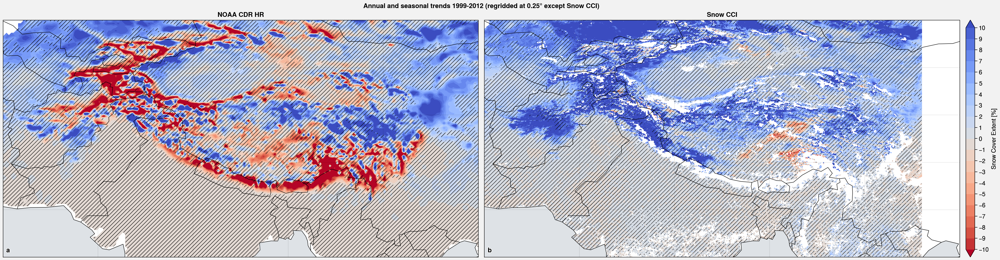

In [62]:
obs_list = [noaa_cdr_hr, snow_cci]
obs_list_names = ['NOAA CDR HR', 'Snow CCI']

fig, axs = plot.subplots(ncols=2, nrows=1, proj='cyl', axwidth=10)

k = 0
for i_season, season in enumerate(['Annual']):
    for obs in [ym_obs[1], ym_obs[3]]:
        m = axs[k].contourf(obs.sel(season=season).slope*10, cmap='CoolWarm_r', levels=plot.arange(-10,10,1), extend='both')
        pvalue = obs.sel(season=season).pvalue
        axs[k].contourf(pvalue.where(pvalue>0.05), hatches=['////'], alpha=0)
        k += 1

fig.colorbar(m, label='Snow Cover Extent [%]')        

axs.format(
    # Grids, labels and limits
    labels=False, lonlines=10, latlines=5, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    abc=True, abcloc='ll',
    collabels=obs_list_names,
    suptitle='Annual and seasonal trends '+period.start+'-'+period.stop+' (regridded at 0.25° except Snow CCI)'
)

# fig.save('img/snc_product_trends_without_regrid.jpg')

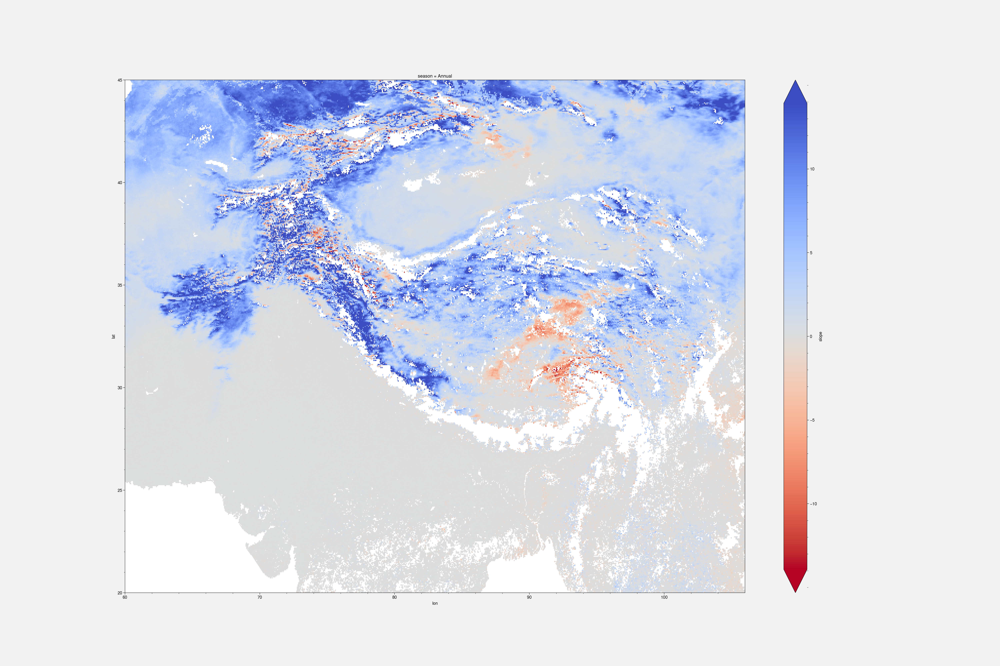

In [60]:
(ym_obs[3][0].slope*10).plot(robust=True, figsize=(30,20), cmap='CoolWarm_r')

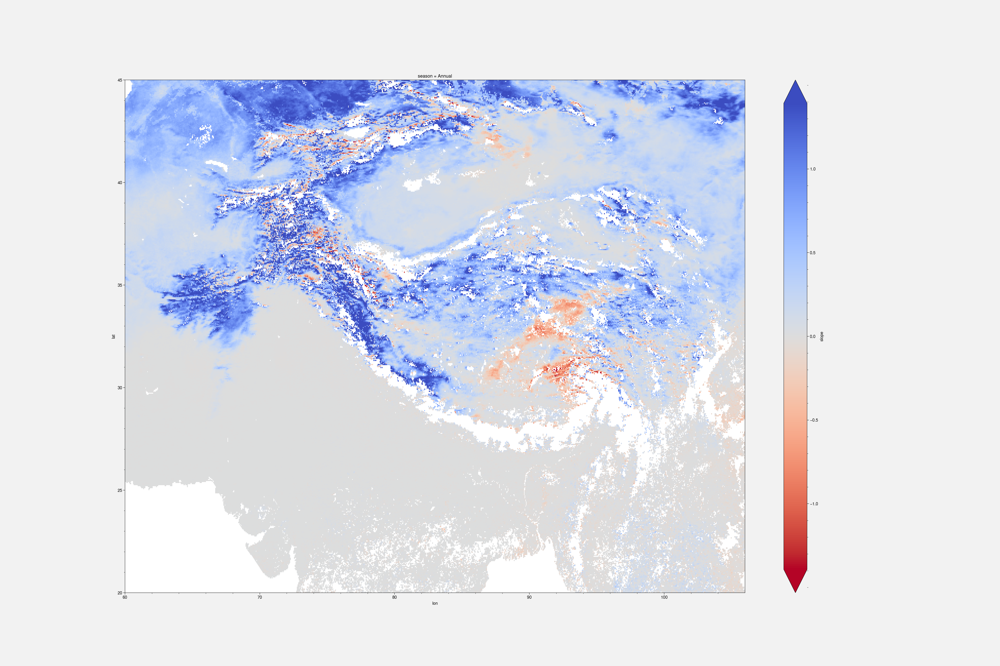

In [47]:
ym_obs[3][0].slope.plot(robust=True, figsize=(30,20), cmap='CoolWarm_r')